## Mengimpor libraries yang Diperlukan

In [481]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas_profiling as pp

## baca data

In [482]:
data = pd.read_csv("diabetes.csv")

In [483]:
# melakukan chech data
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [484]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


## Exploratory Data Analysis

<AxesSubplot:>

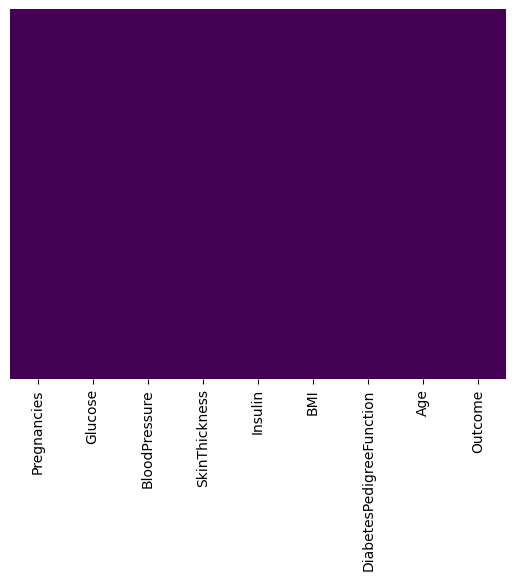

In [485]:
# Memeriksa nilai null menggunakan heatmap
sns.heatmap(data.isnull(),cmap="viridis",cbar=False,yticklabels=False)

In [486]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


Nilai min 0 dalam kolom seperti Glukosa, Tekanan Darah, Ketebalan Kulit, Insulin dan BMI tidak masuk akal.

Ini berarti nilai yang hilang di kolom ini digantikan oleh 0

In [487]:
# mengganti nilai nol menjadi NaNN
data_copy = data.copy(deep = True)
data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

<AxesSubplot:>

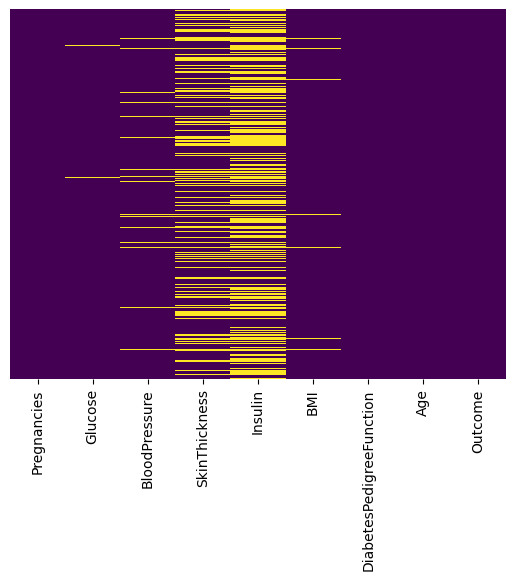

In [488]:
sns.heatmap(data_copy.isnull(),cmap="viridis",cbar=False,yticklabels=False)

In [489]:
data_copy.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [490]:
data_copy["BloodPressure"].fillna(data_copy["BloodPressure"].mean(),inplace=True)
data_copy["SkinThickness"].fillna(data_copy["SkinThickness"].median(),inplace=True)
data_copy["SkinThickness"].fillna(data_copy["SkinThickness"].median(),inplace=True)
data_copy["Insulin"].fillna(data_copy["Insulin"].median(),inplace=True)

In [491]:

data_copy.dropna(inplace=True)

<AxesSubplot:>

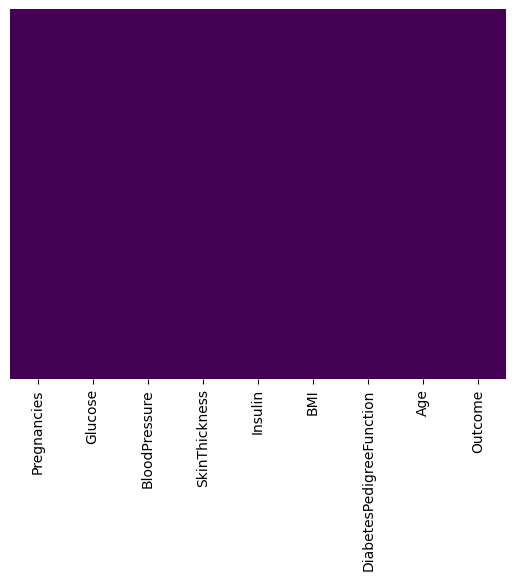

In [492]:
sns.heatmap(data_copy.isnull(),cmap="viridis",cbar=False,yticklabels=False)

In [493]:
pp.ProfileReport(data_copy)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

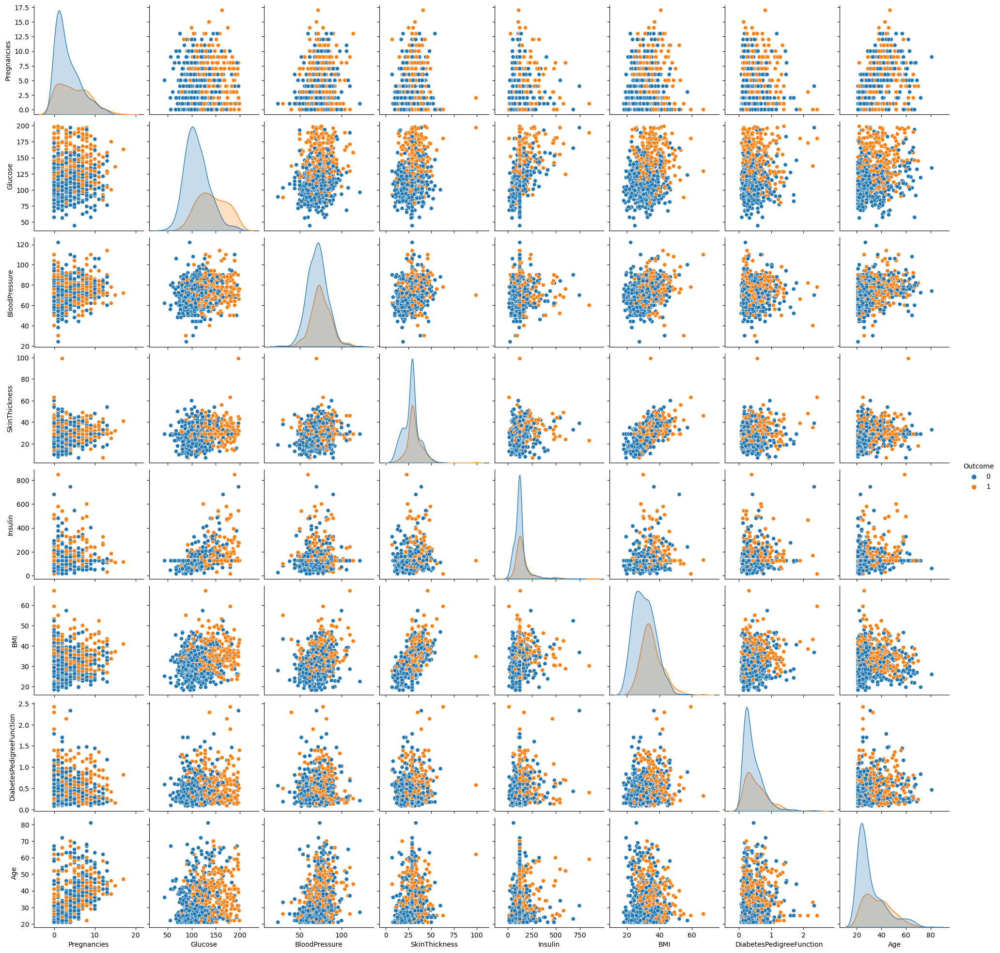

In [494]:
sns.pairplot(data_copy,hue="Outcome")

In [495]:
X=data_copy.drop("Outcome",axis=1)
Y=data_copy["Outcome"]

## Penskalaan Fitur



In [496]:
#standardizing atau normalisasi - penskalaan data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_feat=scaler.fit_transform(X)
df=pd.DataFrame(scaled_feat,columns=X.columns)

## Memisahkan Dataset

In [497]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(scaled_feat,Y,test_size=0.3,random_state=42)

## Membuat model

In [498]:
from sklearn.metrics import classification_report

In [499]:
# Checking Target Labels
data_copy['Outcome'].value_counts()

0    488
1    264
Name: Outcome, dtype: int64

In [500]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [501]:
X=data_copy.drop("Outcome",axis=1)
Y=data_copy["Outcome"]

In [502]:
ros=RandomOverSampler()
X,Y=ros.fit_resample(X,Y)

In [503]:
Y.value_counts()

1    488
0    488
Name: Outcome, dtype: int64

In [504]:

X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.3,random_state=42)

In [505]:
# Importing the Model
from sklearn.ensemble import RandomForestClassifier

In [506]:
rfc = RandomForestClassifier(n_estimators=45)

In [507]:
rfc.fit(X_train,Y_train)

RandomForestClassifier(n_estimators=45)

In [508]:
rfc_prediction = rfc.predict(X_test)

In [509]:
from sklearn.metrics import accuracy_score

# Y_test adalah label sebenarnya dari data pengujian, dan rfc_prediction adalah hasil prediksi model
accuracy = accuracy_score(Y_test, rfc_prediction)

print("Akurasi:", accuracy)


Akurasi: 0.8430034129692833


In [510]:
from sklearn.metrics import confusion_matrix

# Hitung confusion matrix
cm = confusion_matrix(Y_test, rfc_prediction)

# Tampilkan confusion matrix
print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[117  30]
 [ 16 130]]


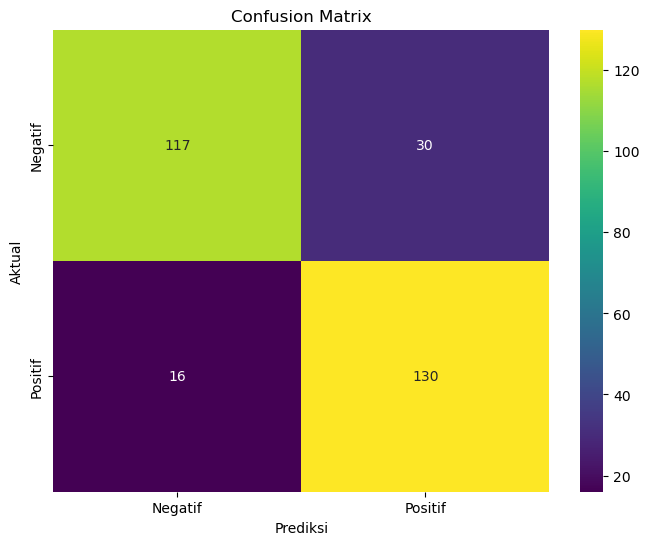

In [511]:
# Visualisasi confusion matrix dengan colormap viridis
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="viridis", xticklabels=["Negatif", "Positif"], yticklabels=["Negatif", "Positif"])
plt.title("Confusion Matrix")
plt.xlabel("Prediksi")
plt.ylabel("Aktual")
plt.show()


In [512]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Menghitung dan menapilkan precision, recall, dan F1-score
precision = precision_score(Y_test, rfc_prediction)
recall = recall_score(Y_test, rfc_prediction)
f1 = f1_score(Y_test, rfc_prediction)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")


Precision: 0.8125
Recall: 0.8904109589041096
F1-Score: 0.8496732026143791


In [513]:
print("RFC Evaluation Report")
print(classification_report(Y_test,rfc_prediction))
print("--------------------------------------------------------")

RFC Evaluation Report
              precision    recall  f1-score   support

           0       0.88      0.80      0.84       147
           1       0.81      0.89      0.85       146

    accuracy                           0.84       293
   macro avg       0.85      0.84      0.84       293
weighted avg       0.85      0.84      0.84       293

--------------------------------------------------------


In [514]:
from sklearn.metrics import accuracy_score

# Y_test adalah label sebenarnya dari data pengujian, dan rfc_prediction adalah hasil prediksi model
accuracy = accuracy_score(Y_test, rfc_prediction)

print("Akurasi:", accuracy)


Akurasi: 0.8430034129692833


## menyimpan model

In [515]:
import pickle

In [516]:
pickle.dump(rfc,open("diabetes_model.sav",'wb'))

## Memeriksa model apakah berhasil atau tidak

In [517]:
# Menyimpan Model
loaded_model = pickle.load(open('diabetes_model.sav', 'rb'))

In [518]:
input_data = (6,148,72,35,0,33.6,0.627,50)

# Mengubah input_data ke array numpy
input_data_as_numpy_array = np.asarray(input_data)

input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = loaded_model.predict(input_data_reshaped)
print(prediction)

if (prediction[0] == 0):
    print('Tidak menderita diabetes')
else:
    print('Menderita diabetes')

[1]
Menderita diabetes


c:\Users\USER\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [519]:
input_data = (1,85,66,29,0,26.6,0.351,31)

# Mengubah input_data ke array numpy
input_data_as_numpy_array = np.asarray(input_data)

input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = loaded_model.predict(input_data_reshaped)
print(prediction)

if (prediction[0] == 0):
    print('Tidak menderita diabetes')
else:
    print('Menderita diabetes')

[0]
Tidak menderita diabetes


c:\Users\USER\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [520]:
for column in X.columns:
    print(column)

Pregnancies
Glucose
BloodPressure
SkinThickness
Insulin
BMI
DiabetesPedigreeFunction
Age
